In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import re
import warnings
warnings.filterwarnings("ignore")

In [2]:
df=pd.read_csv(r"C:\Users\akkid\Downloads\credit_card_churn.csv")

In [3]:
df.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,0.000093,0.99991
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,0.000057,0.99994
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,0.000021,0.99998
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,0.000134,0.99987
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,4716.0,0,4716.0,2.175,816,28,2.500,0.000,0.000022,0.99998


In [4]:
df["Attrition_Flag"].value_counts()

Existing Customer    8500
Attrited Customer    1627
Name: Attrition_Flag, dtype: int64

In [5]:
df["Attrition_Flag"] = df["Attrition_Flag"].map({"Existing Customer":0, "Attrited Customer":1})

In [6]:
df["Attrition_Flag"].value_counts()

0    8500
1    1627
Name: Attrition_Flag, dtype: int64

In [7]:
df.columns

Index(['CLIENTNUM', 'Attrition_Flag', 'Customer_Age', 'Gender',
       'Dependent_count', 'Education_Level', 'Marital_Status',
       'Income_Category', 'Card_Category', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
       'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1',
       'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2'],
      dtype='object')

In [8]:
df.shape

(10127, 23)

In [9]:
df.isnull().sum()

CLIENTNUM                                                                                                                             0
Attrition_Flag                                                                                                                        0
Customer_Age                                                                                                                          0
Gender                                                                                                                                0
Dependent_count                                                                                                                       0
Education_Level                                                                                                                       0
Marital_Status                                                                                                                        0
Income_Category                                 

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 23 columns):
 #   Column                                                                                                                              Non-Null Count  Dtype  
---  ------                                                                                                                              --------------  -----  
 0   CLIENTNUM                                                                                                                           10127 non-null  int64  
 1   Attrition_Flag                                                                                                                      10127 non-null  int64  
 2   Customer_Age                                                                                                                        10127 non-null  int64  
 3   Gender                                                                           

In [11]:
print(df['Attrition_Flag'].unique())
print(df['Customer_Age'].unique())
print(df['Dependent_count'].unique())
print(df['Education_Level'].unique())
print(df['Marital_Status'].unique())
print(df['Income_Category'].unique())
print(df['Months_on_book'].unique())


[0 1]
[45 49 51 40 44 32 37 48 42 65 56 35 57 41 61 47 62 54 59 63 53 58 55 66
 50 38 46 52 39 43 64 68 67 60 73 70 36 34 33 26 31 29 30 28 27]
[3 5 4 2 0 1]
['High School' 'Graduate' 'Uneducated' 'Unknown' 'College' 'Post-Graduate'
 'Doctorate']
['Married' 'Single' 'Unknown' 'Divorced']
['$60K - $80K' 'Less than $40K' '$80K - $120K' '$40K - $60K' '$120K +'
 'Unknown']
[39 44 36 34 21 46 27 31 54 30 48 37 56 42 49 33 28 38 41 43 45 52 40 50
 35 47 32 20 29 25 53 24 55 23 22 26 13 51 19 15 17 18 16 14]


In [12]:
df.drop(['Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1']
        , axis = 1, inplace = True)

In [13]:
df.drop(['Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2'] , axis = 1, inplace = True)

In [14]:
df.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,0,45,M,3,High School,Married,$60K - $80K,Blue,39,...,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,0,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,0,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,0,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,0,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


In [15]:
df["Income_Category"].value_counts()

Less than $40K    3561
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
Unknown           1112
$120K +            727
Name: Income_Category, dtype: int64

In [16]:
df["Income_Category"].replace('Unknown',np.nan,inplace=True)

In [17]:
df["Income_Category"].dropna(inplace=True)

In [18]:
df["Income_Category"].value_counts()

Less than $40K    3561
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
$120K +            727
Name: Income_Category, dtype: int64

In [19]:
df=df.dropna()

In [20]:
df.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,0,45,M,3,High School,Married,$60K - $80K,Blue,39,...,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,0,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,0,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,0,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,0,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


In [21]:
df["Education_Level"].value_counts()

Graduate         2796
High School      1788
Unknown          1374
Uneducated       1302
College           905
Post-Graduate     469
Doctorate         381
Name: Education_Level, dtype: int64

In [22]:
df['Income_Category'].unique()

array(['$60K - $80K', 'Less than $40K', '$80K - $120K', '$40K - $60K',
       '$120K +'], dtype=object)

In [23]:
df["Marital_Status"].value_counts()

Married     4194
Single      3499
Unknown      667
Divorced     655
Name: Marital_Status, dtype: int64

In [24]:
df['Income_Category']

0           $60K - $80K
1        Less than $40K
2          $80K - $120K
3        Less than $40K
4           $60K - $80K
              ...      
10122       $40K - $60K
10123       $40K - $60K
10124    Less than $40K
10125       $40K - $60K
10126    Less than $40K
Name: Income_Category, Length: 9015, dtype: object

In [25]:
df.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,0,45,M,3,High School,Married,$60K - $80K,Blue,39,...,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,0,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,0,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,0,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,0,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


In [26]:
df.duplicated().sum()

0

In [27]:
df.columns

Index(['CLIENTNUM', 'Attrition_Flag', 'Customer_Age', 'Gender',
       'Dependent_count', 'Education_Level', 'Marital_Status',
       'Income_Category', 'Card_Category', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio'],
      dtype='object')

# EDA

# univariate analysis

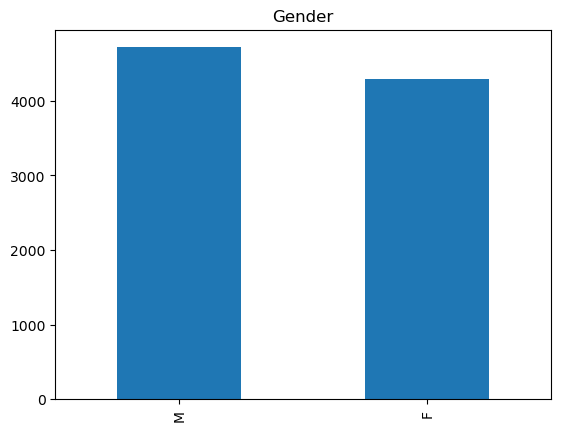

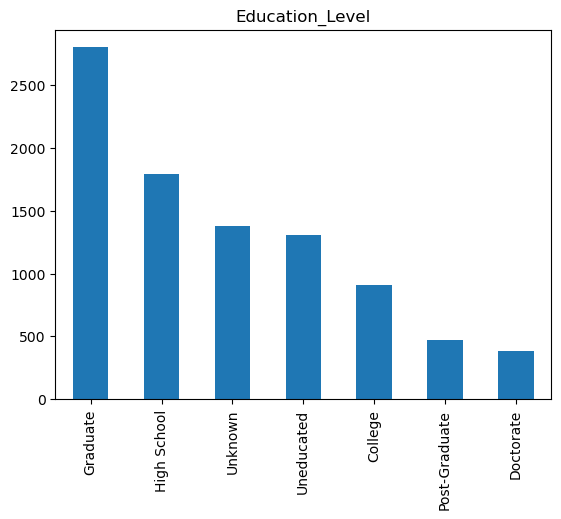

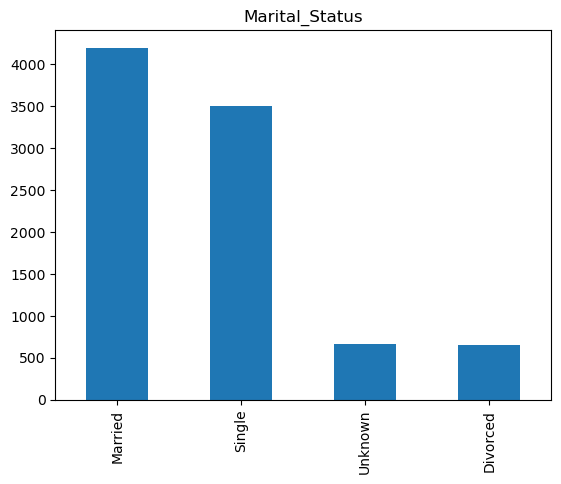

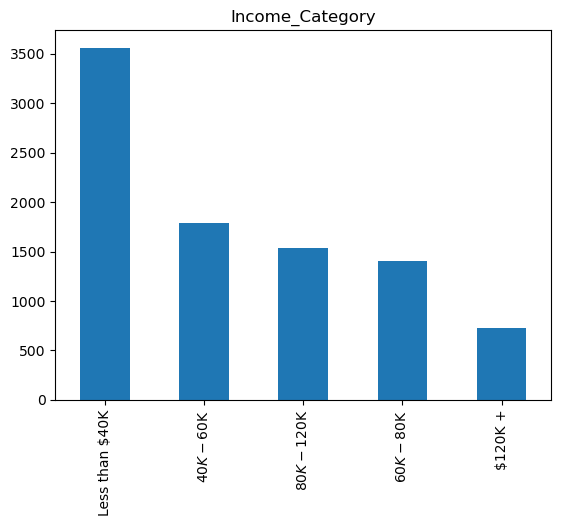

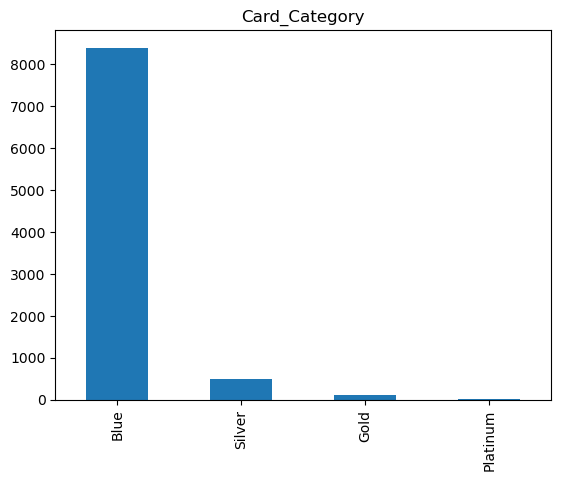

In [28]:
def uni_var(df):
    for column in df.columns:
        if df[column].dtype == object:
                counts = df[column].value_counts()
                counts.plot(kind='bar')
                plt.title(column)
                plt.show()
uni_var(df)

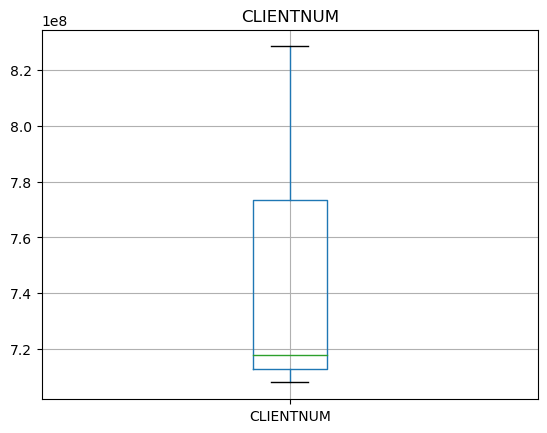

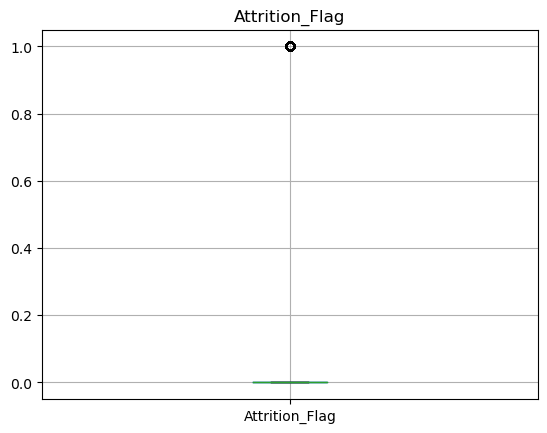

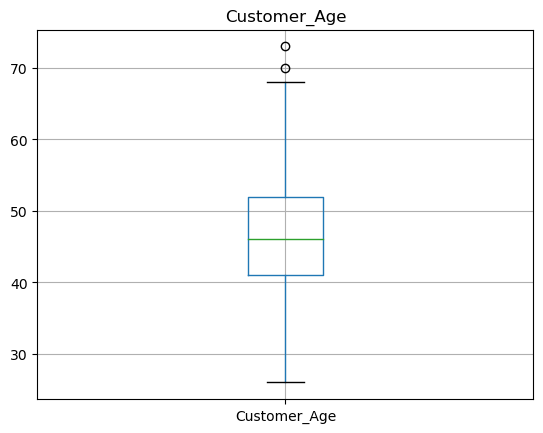

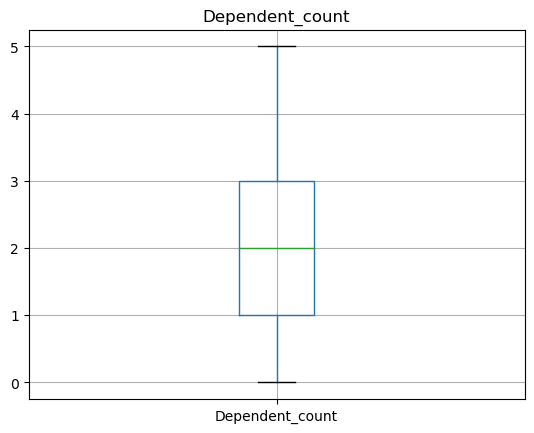

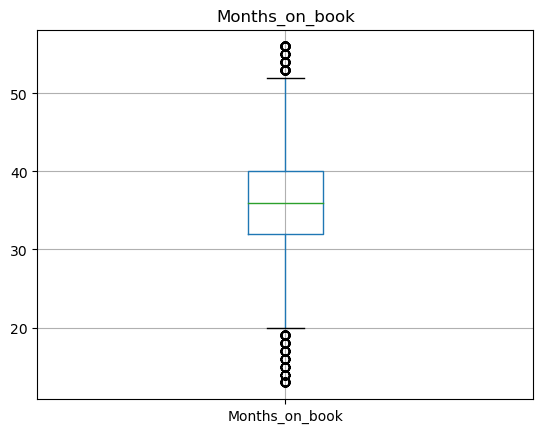

...

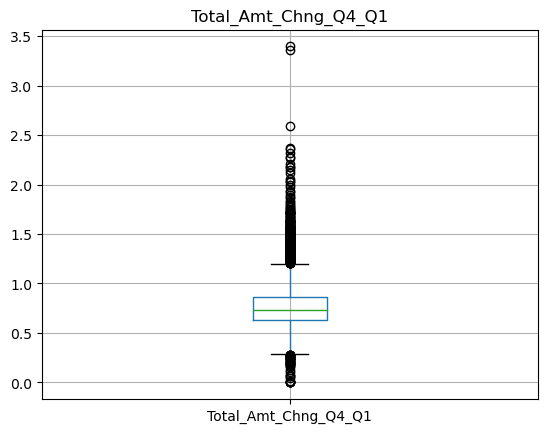

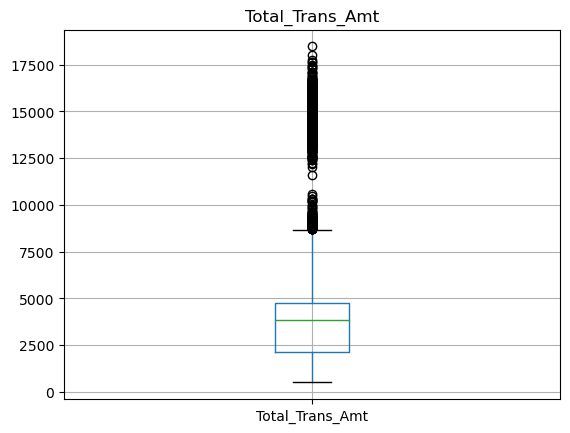

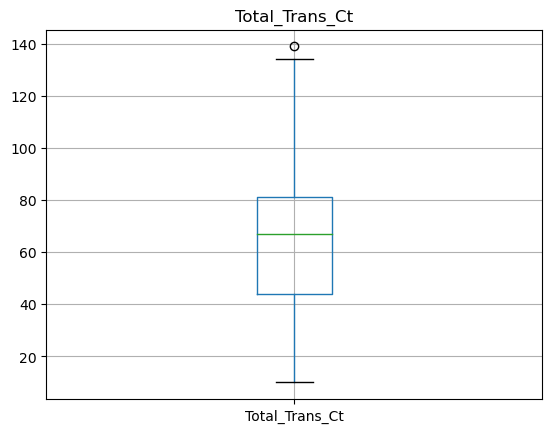

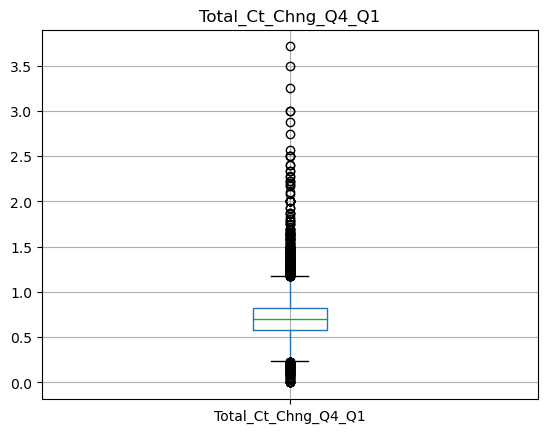

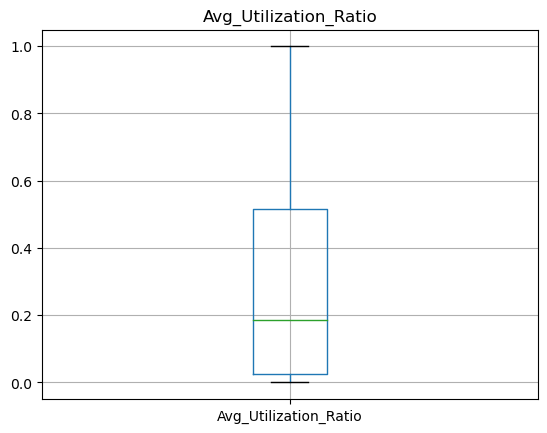

In [29]:
def plot_box(df):
    for column in df.columns:
        if df[column].dtype == np.int64 or df[column].dtype == np.float64:
                plot_box = df.boxplot( column=column)
                plt.title(f"{column}")
                plt.show()
plot_box(df)

# bi variate analysis

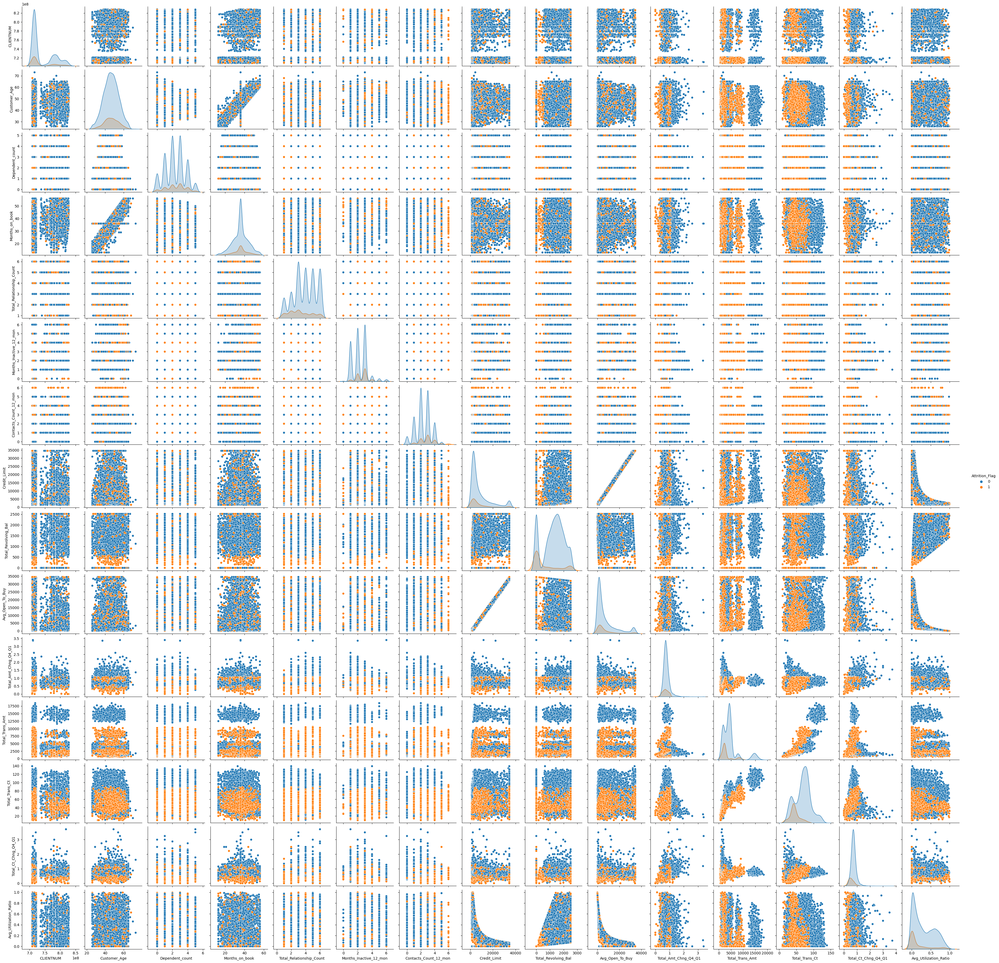

In [30]:
sns.pairplot(df,hue='Attrition_Flag')

<AxesSubplot:xlabel='Attrition_Flag', ylabel='Customer_Age'>

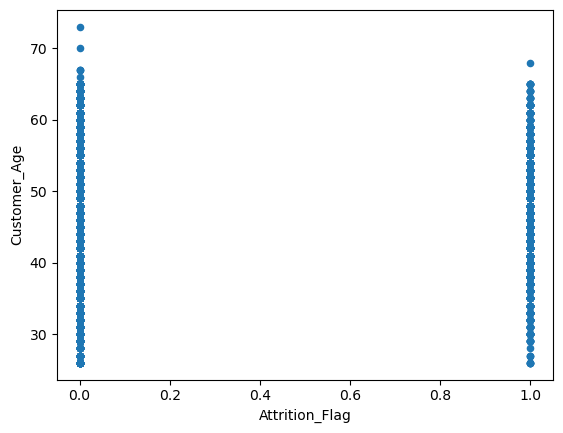

In [31]:
df.plot(kind='scatter',x='Attrition_Flag',y='Customer_Age')

<AxesSubplot:ylabel='Attrition_Flag'>

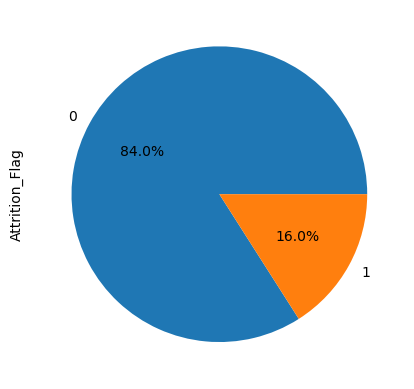

In [32]:
df['Attrition_Flag'].value_counts().plot(kind='pie',autopct='%1.1f%%')

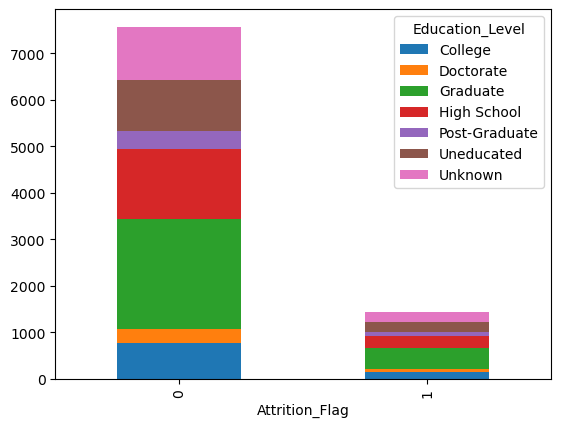

In [33]:
pd.crosstab(df['Attrition_Flag'],df['Education_Level']).plot(kind='bar',stacked=True,)
plt.show()

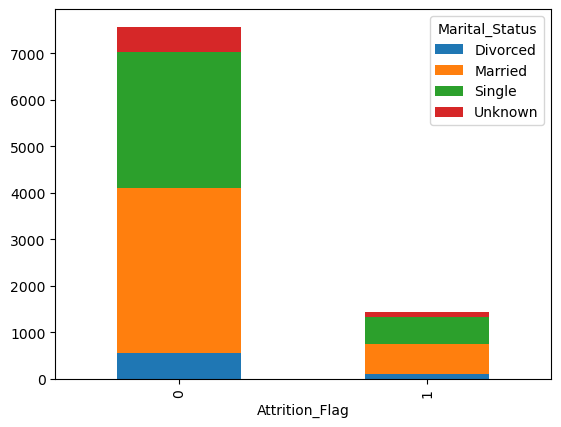

In [34]:
pd.crosstab(df['Attrition_Flag'],df['Marital_Status']).plot(kind='bar',stacked=True,)
plt.show()

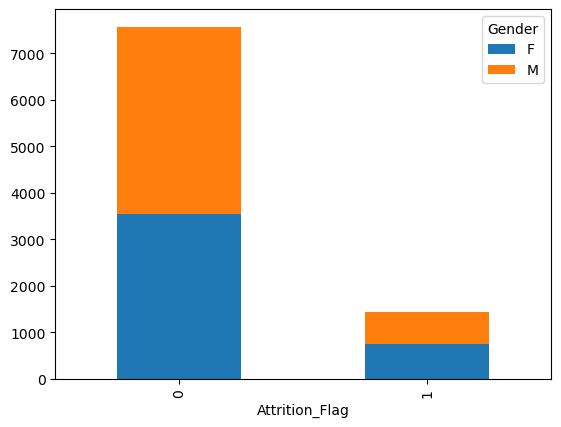

In [35]:
pd.crosstab(df['Attrition_Flag'],df['Gender']).plot(kind='bar',stacked=True,)
plt.show()

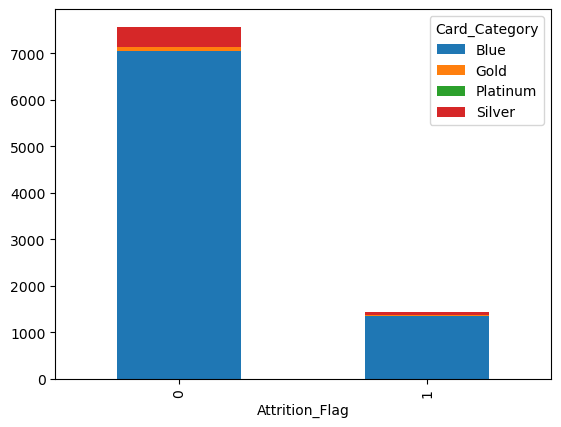

In [36]:
pd.crosstab(df['Attrition_Flag'],df['Card_Category']).plot(kind='bar',stacked=True,)
plt.show()

<AxesSubplot:>

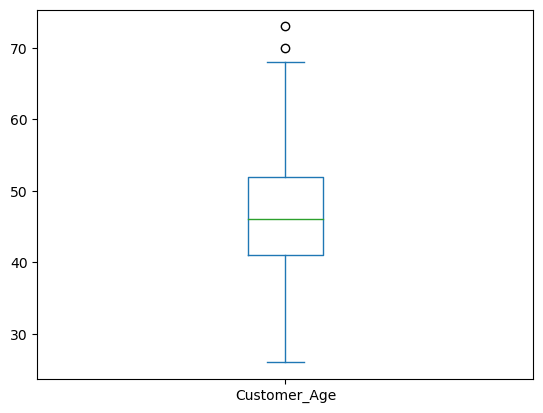

In [37]:
df.plot(kind='box',x='Attrition_Flag',y='Customer_Age')

<AxesSubplot:>

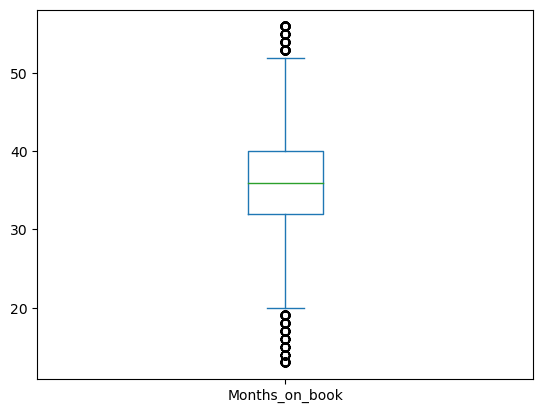

In [38]:
df.plot(kind='box',x='Attrition_Flag',y='Months_on_book')

<AxesSubplot:>

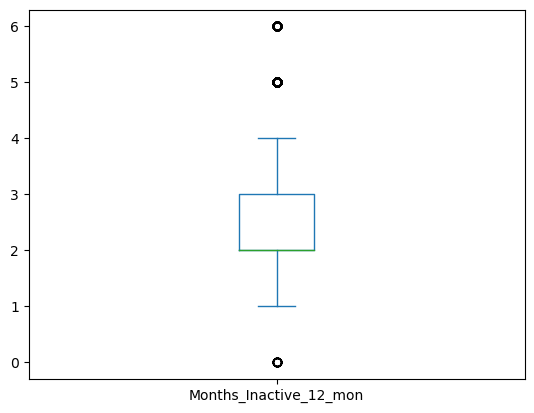

In [39]:
df.plot(kind='box',x='Attrition_Flag',y='Months_Inactive_12_mon')

<AxesSubplot:>

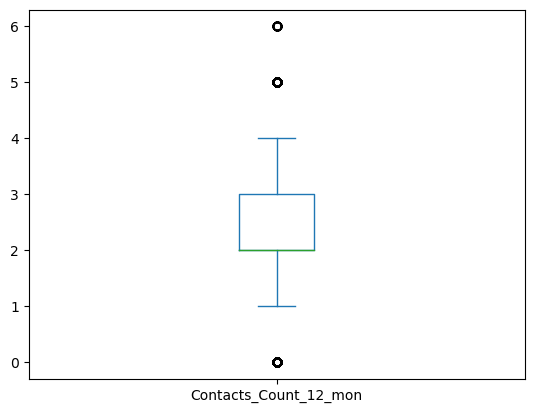

In [40]:
df.plot(kind='box',x='Attrition_Flag',y='Contacts_Count_12_mon')

<AxesSubplot:>

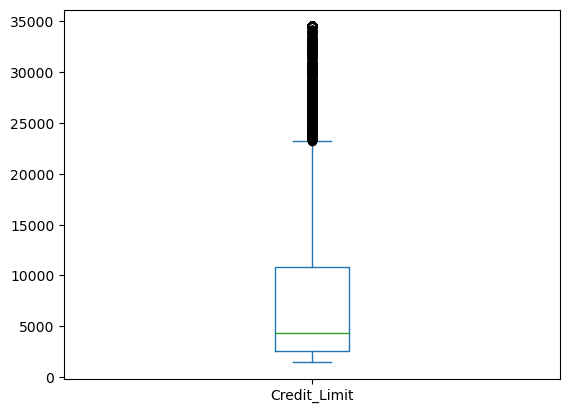

In [41]:
df.plot(kind='box',x='Attrition_Flag',y='Credit_Limit')

<AxesSubplot:>

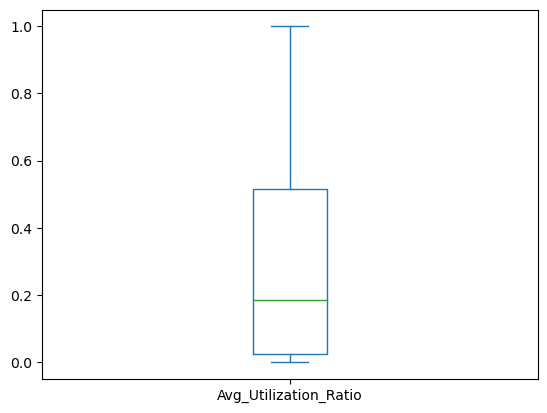

In [42]:
df.plot(kind='box',x='Attrition_Flag',y='Avg_Utilization_Ratio')

<AxesSubplot:>

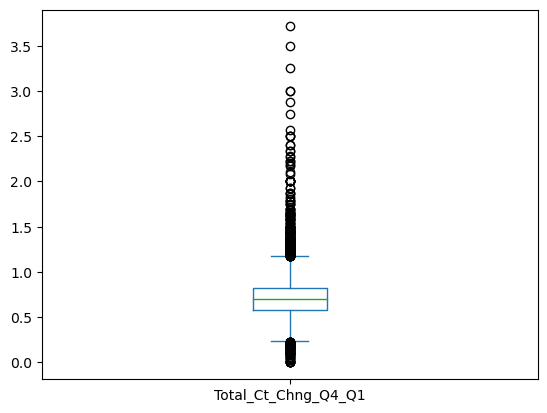

In [43]:
df.plot(kind='box',x='Attrition_Flag',y='Total_Ct_Chng_Q4_Q1')

<AxesSubplot:>

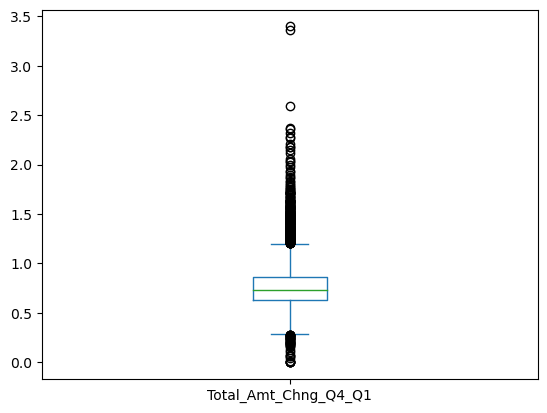

In [44]:
df.plot(kind='box',x='Attrition_Flag',y='Total_Amt_Chng_Q4_Q1')

<AxesSubplot:>

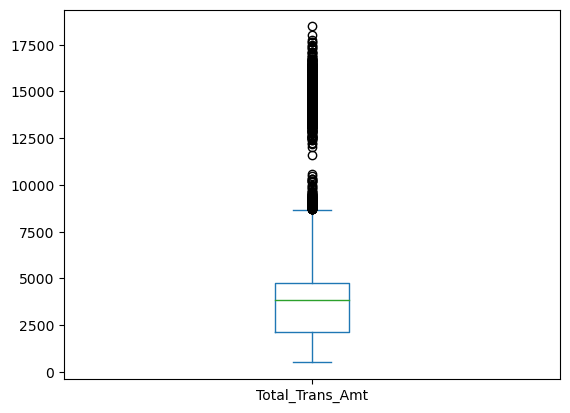

In [45]:
df.plot(kind='box',x='Attrition_Flag',y='Total_Trans_Amt')

<AxesSubplot:>

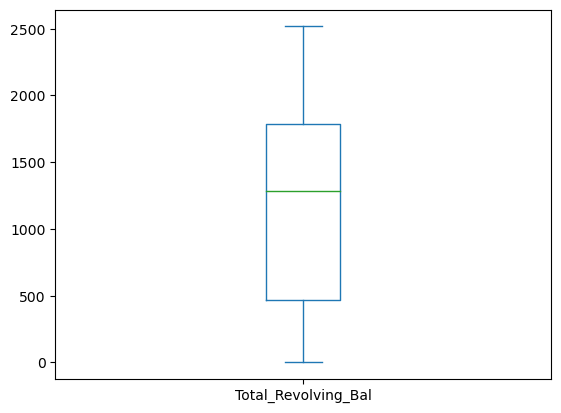

In [46]:
df.plot(kind='box',x='Attrition_Flag',y='Total_Revolving_Bal')

In [47]:
df.columns

Index(['CLIENTNUM', 'Attrition_Flag', 'Customer_Age', 'Gender',
       'Dependent_count', 'Education_Level', 'Marital_Status',
       'Income_Category', 'Card_Category', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio'],
      dtype='object')

<AxesSubplot:>

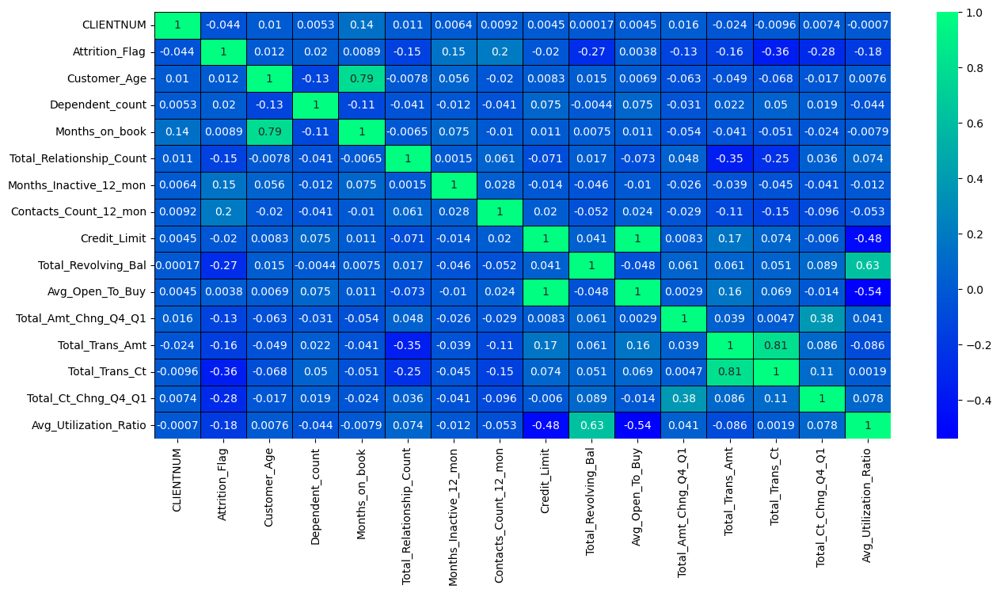

In [48]:
data=df.corr()
plt.figure(figsize=(15,7))
sns.heatmap(data,annot=True,linewidths=0.5,cmap='winter',linecolor='black')

In [49]:
df.drop(['Total_Amt_Chng_Q4_Q1'], axis = 1, inplace = True)
df.drop(['CLIENTNUM'], axis = 1, inplace = True)
df.drop(['Total_Relationship_Count'], axis = 1, inplace = True)
df.drop(['Months_Inactive_12_mon'], axis = 1, inplace = True)
df.drop(['Contacts_Count_12_mon'], axis = 1, inplace = True)
df.drop(['Total_Ct_Chng_Q4_Q1'], axis = 1, inplace = True)
df.drop(['Avg_Utilization_Ratio'], axis = 1, inplace = True)
df.drop(['Dependent_count'], axis = 1, inplace = True)

In [50]:
df.head()

,Attrition_Flag,Customer_Age,Gender,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Trans_Amt,Total_Trans_Ct
0,0,45,M,High School,Married,$60K - $80K,Blue,39,12691.0,777,11914.0,1144,42
1,0,49,F,Graduate,Single,Less than $40K,Blue,44,8256.0,864,7392.0,1291,33
2,0,51,M,Graduate,Married,$80K - $120K,Blue,36,3418.0,0,3418.0,1887,20
3,0,40,F,High School,Unknown,Less than $40K,Blue,34,3313.0,2517,796.0,1171,20
4,0,40,M,Uneducated,Married,$60K - $80K,Blue,21,4716.0,0,4716.0,816,28


In [51]:
df.shape

(9015, 13)

In [52]:
x=df[['Customer_Age','Gender','Education_Level','Marital_Status','Income_Category','Card_Category','Months_on_book','Credit_Limit',
'Total_Revolving_Bal','Avg_Open_To_Buy','Total_Trans_Amt','Total_Trans_Ct']]

y=df['Attrition_Flag']

In [53]:
from sklearn.model_selection import train_test_split

X_train,X_test,y_train,y_test=train_test_split(x,y,train_size=0.75,random_state=100)

print(X_train.shape,y_train.shape)
print(X_test.shape,y_test.shape)

(6761, 12) (6761,)
(2254, 12) (2254,)


# X_train

In [54]:
X_train.head()

,Customer_Age,Gender,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Trans_Amt,Total_Trans_Ct
7664,48,F,Unknown,Married,Less than $40K,Blue,30,4204.0,0,4204.0,2316,43
8555,39,M,Graduate,Single,$60K - $80K,Blue,19,6146.0,0,6146.0,3645,76
3642,43,M,Uneducated,Married,$60K - $80K,Blue,37,3482.0,1942,1540.0,3512,63
3481,52,F,Uneducated,Married,Less than $40K,Blue,43,6897.0,640,6257.0,2781,57
5244,54,F,Doctorate,Single,Less than $40K,Blue,36,2778.0,743,2035.0,4515,74


In [55]:
X_train_cat=X_train.select_dtypes(include=["object"])
X_train_cat.head()

,Gender,Education_Level,Marital_Status,Income_Category,Card_Category
7664,F,Unknown,Married,Less than $40K,Blue
8555,M,Graduate,Single,$60K - $80K,Blue
3642,M,Uneducated,Married,$60K - $80K,Blue
3481,F,Uneducated,Married,Less than $40K,Blue
5244,F,Doctorate,Single,Less than $40K,Blue


In [56]:
X_train_num=X_train.select_dtypes(include=["int64","float64"])
X_train_num.head()

,Customer_Age,Months_on_book,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Trans_Amt,Total_Trans_Ct
7664,48,30,4204.0,0,4204.0,2316,43
8555,39,19,6146.0,0,6146.0,3645,76
3642,43,37,3482.0,1942,1540.0,3512,63
3481,52,43,6897.0,640,6257.0,2781,57
5244,54,36,2778.0,743,2035.0,4515,74


# scaling numerical values

In [57]:
from sklearn.preprocessing import StandardScaler

scaler=StandardScaler()

X_train_num_rescaled = pd.DataFrame(scaler.fit_transform(X_train_num),
                                 columns=X_train_num.columns,
                                 index=X_train_num.index)
X_train_num_rescaled.head()

,Customer_Age,Months_on_book,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Trans_Amt,Total_Trans_Ct
7664,0.210968,-0.738475,-0.474147,-1.438855,-0.344355,-0.610132,-0.913006
8555,-0.921060,-2.113634,-0.259114,-1.438855,-0.129380,-0.226741,0.473166
3642,-0.417936,0.136627,-0.554092,0.946701,-0.639254,-0.265109,-0.072902
3481,0.714092,0.886714,-0.175957,-0.652678,-0.117093,-0.475988,-0.324933
5244,0.965654,0.011612,-0.632045,-0.526152,-0.584458,0.024238,0.389155


In [58]:
X_train_num.describe()

,Customer_Age,Months_on_book,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Trans_Amt,Total_Trans_Ct
count,6761.000000,6761.000000,6761.000000,6761.000000,6761.000000,6761.000000,6761.000000
mean,46.322733,35.907114,8486.096361,1171.322733,7314.773628,4430.982251,64.735542
std,7.950920,7.999664,9031.827932,814.126136,9034.286714,3466.690039,23.808342
min,26.000000,13.000000,1438.300000,0.000000,14.000000,510.000000,10.000000
25%,41.000000,31.000000,2516.000000,470.000000,1249.000000,2126.000000,44.000000
50%,46.000000,36.000000,4396.000000,1281.000000,3338.000000,3857.000000,67.000000
75%,52.000000,40.000000,10817.000000,1786.000000,9537.000000,4748.000000,81.000000
max,73.000000,56.000000,34516.000000,2517.000000,34516.000000,18484.000000,139.000000


# scaling categorical values

In [59]:
X_train_cat_ohe=X_train_cat[['Gender','Marital_Status']]
X_train_cat_ohe.head()

,Gender,Marital_Status
7664,F,Married
8555,M,Single
3642,M,Married
3481,F,Married
5244,F,Single


In [60]:
from sklearn.preprocessing import OneHotEncoder

encoder_ = OneHotEncoder(drop='first',min_frequency=100,  sparse=False)

X_train_cat_ohe = pd.DataFrame(encoder_.fit_transform(X_train_cat_ohe), 
                               columns=encoder_.get_feature_names_out(X_train_cat_ohe.columns), 
                               index = X_train_cat_ohe.index)

X_train_cat_ohe.head()


,Gender_M,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown
7664,0.0,1.0,0.0,0.0
8555,1.0,0.0,1.0,0.0
3642,1.0,1.0,0.0,0.0
3481,0.0,1.0,0.0,0.0
5244,0.0,0.0,1.0,0.0


In [61]:
X_train_cat_le=X_train_cat[['Income_Category','Education_Level','Card_Category']]
X_train_cat_le.head()

,Income_Category,Education_Level,Card_Category
7664,Less than $40K,Unknown,Blue
8555,$60K - $80K,Graduate,Blue
3642,$60K - $80K,Uneducated,Blue
3481,Less than $40K,Uneducated,Blue
5244,Less than $40K,Doctorate,Blue


In [62]:
X_train_cat_le['Card_Category'].value_counts(normalize=True)

Blue        0.930484
Silver      0.055761
Gold        0.012128
Platinum    0.001627
Name: Card_Category, dtype: float64

In [63]:
card_encoder={'Platinum':1,'Gold':2,'Silver':3,'Blue':4}

X_train_cat_le['Card_Category']=X_train_cat_le['Card_Category'].apply(lambda x: card_encoder[x])

X_train_cat_le.head()

,Income_Category,Education_Level,Card_Category
7664,Less than $40K,Unknown,4
8555,$60K - $80K,Graduate,4
3642,$60K - $80K,Uneducated,4
3481,Less than $40K,Uneducated,4
5244,Less than $40K,Doctorate,4


In [64]:
df['Income_Category'].unique()

array(['$60K - $80K', 'Less than $40K', '$80K - $120K', '$40K - $60K',
       '$120K +'], dtype=object)

In [65]:
Income_encoder={'$120K +':1,'$80K - $120K':2,'$60K - $80K':3,'$40K - $60K':4,'Less than $40K':5}

X_train_cat_le['Income_Category']=X_train_cat_le['Income_Category'].apply(lambda x:Income_encoder[x])

X_train_cat_le.head()

,Income_Category,Education_Level,Card_Category
7664,5,Unknown,4
8555,3,Graduate,4
3642,3,Uneducated,4
3481,5,Uneducated,4
5244,5,Doctorate,4


In [66]:
df['Education_Level'].unique()

array(['High School', 'Graduate', 'Uneducated', 'Unknown', 'College',
       'Post-Graduate', 'Doctorate'], dtype=object)

In [67]:
education_encoder={'Doctorate':1,'Post-Graduate':2,'Graduate':3,'College':4,'High School':5,'Uneducated':6,'Unknown':7}

X_train_cat_le['Education_Level']=X_train_cat_le['Education_Level'].apply(lambda x:education_encoder[x])

X_train_cat_le.head()

,Income_Category,Education_Level,Card_Category
7664,5,7,4
8555,3,3,4
3642,3,6,4
3481,5,6,4
5244,5,1,4


# concatinating the one hot encoding features and numerical features

In [68]:
X_train_transformed = pd.concat([X_train_cat_ohe,X_train_cat_le,X_train_num_rescaled],axis=1)
X_train_transformed.head()

,Gender_M,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Income_Category,Education_Level,Card_Category,Customer_Age,Months_on_book,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Trans_Amt,Total_Trans_Ct
7664,0.0,1.0,0.0,0.0,5,7,4,0.210968,-0.738475,-0.474147,-1.438855,-0.344355,-0.610132,-0.913006
8555,1.0,0.0,1.0,0.0,3,3,4,-0.921060,-2.113634,-0.259114,-1.438855,-0.129380,-0.226741,0.473166
3642,1.0,1.0,0.0,0.0,3,6,4,-0.417936,0.136627,-0.554092,0.946701,-0.639254,-0.265109,-0.072902
3481,0.0,1.0,0.0,0.0,5,6,4,0.714092,0.886714,-0.175957,-0.652678,-0.117093,-0.475988,-0.324933
5244,0.0,0.0,1.0,0.0,5,1,4,0.965654,0.011612,-0.632045,-0.526152,-0.584458,0.024238,0.389155


# X_test data

In [69]:
X_test.head()

,Customer_Age,Gender,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Trans_Amt,Total_Trans_Ct
2978,48,F,Unknown,Married,Less than $40K,Blue,37,5758.0,0,5758.0,4422,76
9057,41,M,High School,Divorced,$80K - $120K,Blue,28,16627.0,2118,14509.0,7996,99
1839,38,M,Unknown,Married,$60K - $80K,Blue,31,2014.0,896,1118.0,2460,52
5693,37,F,Graduate,Single,Less than $40K,Blue,28,1438.3,599,839.3,5136,76
5331,45,M,Graduate,Married,$80K - $120K,Blue,36,21630.0,0,21630.0,4584,84


In [70]:
X_test_num=X_test.select_dtypes(include=["int64","float64"])
X_test_num.head()

,Customer_Age,Months_on_book,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Trans_Amt,Total_Trans_Ct
2978,48,37,5758.0,0,5758.0,4422,76
9057,41,28,16627.0,2118,14509.0,7996,99
1839,38,31,2014.0,896,1118.0,2460,52
5693,37,28,1438.3,599,839.3,5136,76
5331,45,36,21630.0,0,21630.0,4584,84


In [71]:
X_test_cat=X_test.select_dtypes(include=["object"])
X_test_cat.head()

,Gender,Education_Level,Marital_Status,Income_Category,Card_Category
2978,F,Unknown,Married,Less than $40K,Blue
9057,M,High School,Divorced,$80K - $120K,Blue
1839,M,Unknown,Married,$60K - $80K,Blue
5693,F,Graduate,Single,Less than $40K,Blue
5331,M,Graduate,Married,$80K - $120K,Blue


In [72]:
X_test_num_rescaled = pd.DataFrame(scaler.transform(X_test_num), 
                                   columns = X_test_num.columns, 
                                   index = X_test_num.index)

X_test_num_rescaled.head()


,Customer_Age,Months_on_book,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Trans_Amt,Total_Trans_Ct
2978,0.210968,0.136627,-0.302076,-1.438855,-0.172331,-0.002591,0.473166
9057,-0.669498,-0.988504,0.901424,1.162900,0.796384,1.028440,1.439285
1839,-1.046841,-0.613460,-0.716641,-0.338207,-0.685968,-0.568591,-0.534959
5693,-1.172622,-0.988504,-0.780387,-0.703042,-0.716819,0.203384,0.473166
5331,-0.166375,0.011612,1.455395,-1.438855,1.584661,0.044143,0.809207


# converting categorical to numerical by one hot encoding

In [73]:
X_test_cat_ohe=X_test_cat[['Gender','Marital_Status']]
X_test_cat_ohe.head()

,Gender,Marital_Status
2978,F,Married
9057,M,Divorced
1839,M,Married
5693,F,Single
5331,M,Married


In [74]:
encoder= OneHotEncoder(drop='first',min_frequency=100,  sparse=False)

X_test_cat_ohe = pd.DataFrame(encoder_.transform(X_test_cat_ohe), 
                               columns=encoder_.get_feature_names_out(X_test_cat_ohe.columns), 
                               index = X_test_cat_ohe.index)

X_test_cat_ohe.head()


,Gender_M,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown
2978,0.0,1.0,0.0,0.0
9057,1.0,0.0,0.0,0.0
1839,1.0,1.0,0.0,0.0
5693,0.0,0.0,1.0,0.0
5331,1.0,1.0,0.0,0.0


In [75]:
X_test_num_rescaled = pd.DataFrame(scaler.transform(X_test_num),
                                 columns=X_test_num.columns,
                                 index=X_test_num.index)
X_test_num_rescaled.head()

,Customer_Age,Months_on_book,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Trans_Amt,Total_Trans_Ct
2978,0.210968,0.136627,-0.302076,-1.438855,-0.172331,-0.002591,0.473166
9057,-0.669498,-0.988504,0.901424,1.162900,0.796384,1.028440,1.439285
1839,-1.046841,-0.613460,-0.716641,-0.338207,-0.685968,-0.568591,-0.534959
5693,-1.172622,-0.988504,-0.780387,-0.703042,-0.716819,0.203384,0.473166
5331,-0.166375,0.011612,1.455395,-1.438855,1.584661,0.044143,0.809207


In [76]:
X_test_cat_le=pd.DataFrame(index=X_test_cat.index)
X_test_cat_le.head()

""
2978
9057
1839
5693
5331


In [77]:
X_test_cat_le=X_test_cat[['Income_Category','Education_Level','Card_Category']]
X_test_cat_le.head()

,Income_Category,Education_Level,Card_Category
2978,Less than $40K,Unknown,Blue
9057,$80K - $120K,High School,Blue
1839,$60K - $80K,Unknown,Blue
5693,Less than $40K,Graduate,Blue
5331,$80K - $120K,Graduate,Blue


In [78]:
X_test_cat_le['Income_Category']=X_test_cat['Income_Category'].apply(lambda x: Income_encoder[x])

X_test_cat_le['Education_Level']=X_test_cat['Education_Level'].apply(lambda x: education_encoder[x])

X_test_cat_le['Card_Category']=X_test_cat['Card_Category'].apply(lambda x: card_encoder[x])

X_test_cat_le.head()

,Income_Category,Education_Level,Card_Category
2978,5,7,4
9057,2,5,4
1839,3,7,4
5693,5,3,4
5331,2,3,4


In [79]:
X_test_cat_le['Income_Category'].info()

<class 'pandas.core.series.Series'>
Int64Index: 2254 entries, 2978 to 8034
Series name: Income_Category
Non-Null Count  Dtype
--------------  -----
2254 non-null   int64
dtypes: int64(1)
memory usage: 35.2 KB


In [80]:
X_test_transformed=pd.concat([X_test_cat_ohe,X_test_cat_le,X_test_num_rescaled],axis=1)

X_test_transformed.head()

,Gender_M,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Income_Category,Education_Level,Card_Category,Customer_Age,Months_on_book,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Trans_Amt,Total_Trans_Ct
2978,0.0,1.0,0.0,0.0,5,7,4,0.210968,0.136627,-0.302076,-1.438855,-0.172331,-0.002591,0.473166
9057,1.0,0.0,0.0,0.0,2,5,4,-0.669498,-0.988504,0.901424,1.162900,0.796384,1.028440,1.439285
1839,1.0,1.0,0.0,0.0,3,7,4,-1.046841,-0.613460,-0.716641,-0.338207,-0.685968,-0.568591,-0.534959
5693,0.0,0.0,1.0,0.0,5,3,4,-1.172622,-0.988504,-0.780387,-0.703042,-0.716819,0.203384,0.473166
5331,1.0,1.0,0.0,0.0,2,3,4,-0.166375,0.011612,1.455395,-1.438855,1.584661,0.044143,0.809207


In [81]:
pip install -U threadpoolctl

Note: you may need to restart the kernel to use updated packages.


In [82]:
pip install keras_tuner

Note: you may need to restart the kernel to use updated packages.


In [83]:
print(X_train.shape, y_train.shape)

(6761, 12) (6761,)


# balancing the data

In [84]:
import imblearn

from imblearn.over_sampling import SMOTE
import keras_tuner as k
import keras
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from keras import Sequential # creates network in sequential form
from keras.layers import Dense   # creates fully connected layers
from keras.layers import Dropout, BatchNormalization, Input
from sklearn.metrics import accuracy_score
from sklearn.metrics import accuracy_score,ConfusionMatrixDisplay
from sklearn.metrics import confusion_matrix
from keras.regularizers import L1,L2,L1L2
from keras.initializers import Zeros,ones,GlorotNormal,GlorotUniform,HeNormal,HeUniform,RandomNormal,RandomUniform  # w.t's initializers


Using TensorFlow backend


In [85]:
s=SMOTE()

In [86]:
x_train,y_train = s.fit_resample(X_train_transformed,y_train)


In [87]:
y_train.value_counts()

1    5681
0    5681
Name: Attrition_Flag, dtype: int64

In [88]:
print(x_train.shape)
print(y_train.shape)

(11362, 14)
(11362,)


In [89]:
print(X_test_transformed.shape)
print(y_test.shape)

(2254, 14)
(2254,)


In [99]:
def modelss(hp):      # hp is hyper parameter
    model = Sequential()
    model.add(Input(shape = (14,)))

    for i in range(hp.Int("hidden_layers", min_value = 5, max_value = 20)):
        model.add(Dense(units = hp.Int("neurons{}".format(i), min_value = 4, max_value = 50),activation= "relu"))

    model.add(Dense(1,activation="sigmoid"))
    model.compile(optimizer=hp.Choice("optimizer", values = ["sgd","adam","adadelta","rmsprop"]),loss="binary_crossentropy",metrics=["accuracy"])
    
    return model

In [108]:
tuner = k.RandomSearch(modelss, objective = "val_accuracy", max_trials = 5, directory = r"C:\Users\akkid\OneDrive\Desktop\New folder", project_name = "f4")   # obj--> used for maximise or minimize our loss

In [109]:
tuner.search(x_train, y_train, epochs = 30, validation_data = (X_test_transformed,y_test))

Trial 5 Complete [00h 00m 18s]
val_accuracy: 0.9108251929283142

Best val_accuracy So Far: 0.9108251929283142
Total elapsed time: 00h 01m 47s


In [110]:
tuner.search_space_summary()

Search space summary
Default search space size: 15
hidden_layers (Int)
{'default': None, 'conditions': [], 'min_value': 5, 'max_value': 20, 'step': 1, 'sampling': 'linear'}
neurons0 (Int)
{'default': None, 'conditions': [], 'min_value': 4, 'max_value': 50, 'step': 1, 'sampling': 'linear'}
neurons1 (Int)
{'default': None, 'conditions': [], 'min_value': 4, 'max_value': 50, 'step': 1, 'sampling': 'linear'}
neurons2 (Int)
{'default': None, 'conditions': [], 'min_value': 4, 'max_value': 50, 'step': 1, 'sampling': 'linear'}
neurons3 (Int)
{'default': None, 'conditions': [], 'min_value': 4, 'max_value': 50, 'step': 1, 'sampling': 'linear'}
neurons4 (Int)
{'default': None, 'conditions': [], 'min_value': 4, 'max_value': 50, 'step': 1, 'sampling': 'linear'}
optimizer (Choice)
{'default': 'sgd', 'conditions': [], 'values': ['sgd', 'adam', 'adadelta', 'rmsprop'], 'ordered': False}
neurons5 (Int)
{'default': None, 'conditions': [], 'min_value': 4, 'max_value': 50, 'step': 1, 'sampling': 'linear'}
n

In [111]:
tuner.results_summary()

Results summary
Results in C:\Users\akkid\OneDrive\Desktop\New folder\f4
Showing 10 best trials
Objective(name="val_accuracy", direction="max")

Trial 4 summary
Hyperparameters:
hidden_layers: 5
neurons0: 25
neurons1: 36
neurons2: 12
neurons3: 24
neurons4: 16
optimizer: rmsprop
neurons5: 38
neurons6: 31
neurons7: 29
neurons8: 8
neurons9: 44
neurons10: 34
neurons11: 43
neurons12: 48
Score: 0.9108251929283142

Trial 0 summary
Hyperparameters:
hidden_layers: 8
neurons0: 10
neurons1: 39
neurons2: 21
neurons3: 46
neurons4: 46
optimizer: adam
neurons5: 4
neurons6: 4
neurons7: 4
Score: 0.9055013060569763

Trial 1 summary
Hyperparameters:
hidden_layers: 9
neurons0: 4
neurons1: 35
neurons2: 38
neurons3: 5
neurons4: 31
optimizer: adam
neurons5: 30
neurons6: 47
neurons7: 43
neurons8: 4
Score: 0.8899734020233154

Trial 2 summary
Hyperparameters:
hidden_layers: 13
neurons0: 34
neurons1: 40
neurons2: 26
neurons3: 12
neurons4: 44
optimizer: sgd
neurons5: 28
neurons6: 13
neurons7: 21
neurons8: 32
neur

In [112]:
tuner.get_best_hyperparameters()[0].values

{'hidden_layers': 5,
 'neurons0': 25,
 'neurons1': 36,
 'neurons2': 12,
 'neurons3': 24,
 'neurons4': 16,
 'optimizer': 'rmsprop',
 'neurons5': 38,
 'neurons6': 31,
 'neurons7': 29,
 'neurons8': 8,
 'neurons9': 44,
 'neurons10': 34,
 'neurons11': 43,
 'neurons12': 48}

In [113]:
fmodel = tuner.get_best_models(num_models=1)[0]

In [114]:
fmodel.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 25)                375       
                                                                 
 dense_1 (Dense)             (None, 36)                936       
                                                                 
 dense_2 (Dense)             (None, 12)                444       
                                                                 
 dense_3 (Dense)             (None, 24)                312       
                                                                 
 dense_4 (Dense)             (None, 16)                400       
                                                                 
 dense_5 (Dense)             (None, 1)                 17        
                                                                 
Total params: 2484 (9.70 KB)
Trainable params: 2484 (9.7

In [120]:
hist = fmodel.fit(x_train, y_train, epochs = 30, batch_size = 10 ,validation_split= 0.1)

Epoch 1/30
1023/1023 [==============================] - 1s 1ms/step - loss: 0.2498 - accuracy: 0.9032 - val_loss: 0.1388 - val_accuracy: 0.9516
Epoch 2/30
1023/1023 [==============================] - 1s 1ms/step - loss: 0.2370 - accuracy: 0.9077 - val_loss: 0.2134 - val_accuracy: 0.9182
Epoch 3/30
1023/1023 [==============================] - 1s 1ms/step - loss: 0.2295 - accuracy: 0.9121 - val_loss: 0.2136 - val_accuracy: 0.9129
Epoch 4/30
1023/1023 [==============================] - 1s 1ms/step - loss: 0.2257 - accuracy: 0.9108 - val_loss: 0.1255 - val_accuracy: 0.9648
Epoch 5/30
1023/1023 [==============================] - 1s 1ms/step - loss: 0.2246 - accuracy: 0.9111 - val_loss: 0.1579 - val_accuracy: 0.9499
Epoch 6/30
1023/1023 [==============================] - 1s 1ms/step - loss: 0.2252 - accuracy: 0.9113 - val_loss: 0.2750 - val_accuracy: 0.9068
Epoch 7/30
1023/1023 [==============================] - 1s 1ms/step - loss: 0.2205 - accuracy: 0.9138 - val_loss: 0.1686 - val_accuracy:

In [121]:
print(x_train.shape)
print(y_train.shape)

(11362, 14)
(11362,)


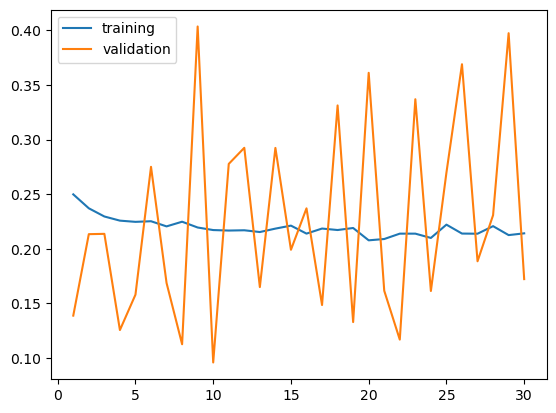

In [123]:
plt.plot(range(1,31),hist.history["loss"],label="training")
plt.plot(range(1,31),hist.history["val_loss"],label="validation")
plt.legend()

In [124]:
hist.history['val_loss']

[0.13875125348567963,
 0.21335874497890472,
 0.2136460542678833,
 0.12554742395877838,
 0.15793852508068085,
 0.2750358581542969,
 0.16864560544490814,
 0.1125354915857315,
 0.4035745859146118,
 0.09583599865436554,
 0.27770891785621643,
 0.2924529016017914,
 0.16489261388778687,
 0.29234546422958374,
 0.19906319677829742,
 0.23700174689292908,
 0.14845174551010132,
 0.3312624990940094,
 0.13284510374069214,
 0.3611328601837158,
 0.16152407228946686,
 0.11677559465169907,
 0.3369463384151459,
 0.1613088846206665,
 0.269711434841156,
 0.36899036169052124,
 0.18851901590824127,
 0.23073500394821167,
 0.39743277430534363,
 0.17218944430351257]

In [126]:
predicted=fmodel.predict(X_test_transformed)

71/71 [==============================] - 0s 745us/step


In [127]:
predicted=np.where(predicted>0.5,1,0)

In [128]:
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay

In [129]:
print("accuracy", accuracy_score(y_test, predicted))

accuracy 0.9028393966282166


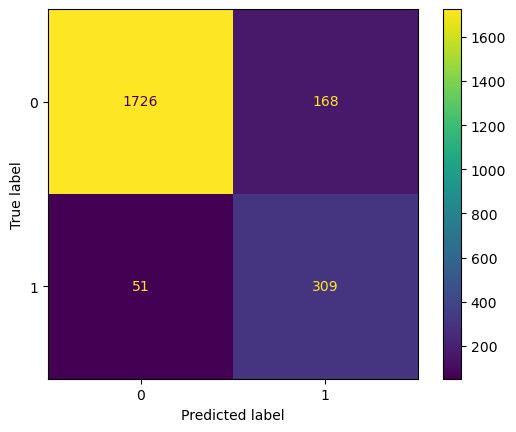

In [130]:
cm = confusion_matrix(y_test,predicted)
va = ConfusionMatrixDisplay(cm)
va.plot()
plt.show()